# Load Data

## Import Packages

In [1]:
import sys
import dotenv 
import os
import requests
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon, box
import osmnx as ox
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from pyogrio import list_layers


dotenv.load_dotenv()  
sys.path.append(os.path.dirname(os.getcwd()))
from scripts.utils import rename_traffic_columns, load_data, GeoStationFilter
from scripts.data_downloader import DataDownloader  
from scripts.geocode_stations import geocode_stations, create_interactive_map

import numpy as np


import warnings
warnings.filterwarnings("ignore")

# Fetch Road Traffic Count data

## Emilia-Romagna Regional Traffic Data 

### Find the monitoring stations inside Bologna Province only

In [2]:
filter_name = "Bologna, Italy"        # Sub-region filter
place_name = "Emilia-Romagna, Italy"  # Main region
xlsx_file = '../data/monitoring_stations.xlsx'

filter_tool = GeoStationFilter(xlsx_file)
filter_tool.filter_by_place(filter_name)

Loaded 292 stations from '../data/monitoring_stations.xlsx'.


,NAME,LAT_MM1,LONG_MM1,LAT_WGS84,LONG_WGS84,geometry,bbox_north,bbox_south,bbox_east,bbox_west,...,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
48,152,4929067.228,1679817.955,44.492381,11.261233,POINT (11.26123 44.49238),44.556094,44.421053,11.433608,11.229621,...,43172,44.49382,11.342633,boundary,administrative,16,0.72895,city,Bologna,"Bologna, Emilia-Romagna, Italy"
224,502,4932823.936,1678273.253,44.526558,11.243117,POINT (11.24312 44.52656),44.556094,44.421053,11.433608,11.229621,...,43172,44.49382,11.342633,boundary,administrative,16,0.72895,city,Bologna,"Bologna, Emilia-Romagna, Italy"


In [3]:
# With buffer
filter_tool.filter_by_place(filter_name, buffer_km=2.5)

,NAME,LAT_MM1,LONG_MM1,LAT_WGS84,LONG_WGS84,geometry
48,152,4929067.228,1679817.955,44.492381,11.261233,POINT (11.26123 44.49238)
50,154,4921128.171,1686727.084,44.419217,11.345198,POINT (11.34520 44.41922)
52,156,4930637.206,1694669.570,44.502653,11.448451,POINT (11.44845 44.50265)
53,157,4934675.882,1693670.821,44.539247,11.437413,POINT (11.43741 44.53925)
55,160,4935885.299,1680456.550,44.553554,11.271642,POINT (11.27164 44.55355)
64,177,4928087.451,1693464.135,44.480044,11.432347,POINT (11.43235 44.48004)
224,502,4932823.936,1678273.253,44.526558,11.243117,POINT (11.24312 44.52656)
289,683,4934027.548,1693968.102,44.533336,11.440908,POINT (11.44091 44.53334)


In [4]:
selected_stations = filter_tool.filter_by_place(filter_name, buffer_km=2.5).NAME.unique()


In [5]:
# show the current map with the filtered stations
# filter_tool.show_map(place_name, filter_name)

In [6]:
map = filter_tool.show_buffer_map(place_name, filter_name, 2.5)

Found 8 stations with the buffer zone of 2.5km around Bologna, Italy.


### Load the regional Data

In [7]:
downloader = DataDownloader('../data/DGCTA - Flussi di Traffico.csv')


Loading data from: ../data/DGCTA - Flussi di Traffico.csv
Successfully loaded 196 records


In [8]:
downloader.data_map[2024,1]   # shows info about the data for December 2009
# generally it contains data after 2009, 1

{'dataset_id': 'DS-1944',
 'url': 'https://rerdatahub.blob.core.windows.net/open-datahub/DS-1944/2024/01_Gennaio_2024.csv',
 'frequency': 'SETTIMANALE',
 'status_code': 'S',
 'timestamp': '2024-08-02 19:20:06',
 'availability': 'OPEN'}

In [9]:
# downloads the data in parallel for the full year
downloader.download_year(2024)

File already exists. Skipping download: ../data/regional_traffic_data_downloads/12_Dicembre_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/10_Ottobre_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/08_Agosto_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/07_Luglio_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/11_Novembre_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/09_Settembre_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/04_Aprile_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/06_Giugno_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/03_Marzo_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/01_Gennaio_2024.csv
Fi

['../data/regional_traffic_data_downloads/07_Luglio_2024.csv',
 '../data/regional_traffic_data_downloads/10_Ottobre_2024.csv',
 '../data/regional_traffic_data_downloads/08_Agosto_2024.csv',
 '../data/regional_traffic_data_downloads/12_Dicembre_2024.csv',
 '../data/regional_traffic_data_downloads/09_Settembre_2024.csv',
 '../data/regional_traffic_data_downloads/11_Novembre_2024.csv',
 '../data/regional_traffic_data_downloads/04_Aprile_2024.csv',
 '../data/regional_traffic_data_downloads/06_Giugno_2024.csv',
 '../data/regional_traffic_data_downloads/03_Marzo_2024.csv',
 '../data/regional_traffic_data_downloads/01_Gennaio_2024.csv',
 '../data/regional_traffic_data_downloads/05_Maggio_2024.csv',
 '../data/regional_traffic_data_downloads/02_Febbraio_2024.csv']

In [10]:
df = load_data(selected_stations=selected_stations, downloader=downloader, year=2024)


File already exists. Skipping download: ../data/regional_traffic_data_downloads/01_Gennaio_2024.csv


File already exists. Skipping download: ../data/regional_traffic_data_downloads/02_Febbraio_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/03_Marzo_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/04_Aprile_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/05_Maggio_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/06_Giugno_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/07_Luglio_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/08_Agosto_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/09_Settembre_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/10_Ottobre_2024.csv
File already exists. Skipping download: ../data/regional_traffic_data_downloads/11_Novembre_2024.csv
Fil

In [11]:
df.shape

(1111511, 5)

In [12]:
df.head()

,datetime,MTSStationID,DirectionCode,VehicleType,TransitCount
0,2024-01-01,152,0,2,24
1,2024-01-01,152,0,4,1
2,2024-01-01,152,1,2,31
3,2024-01-01,152,1,4,1
4,2024-01-01,154,0,2,1


In [13]:
# station 157 is not available for the whole year
df.MTSStationID.unique(), selected_stations

(array([152, 154, 156, 160, 177, 502, 683]),
 array([152, 154, 156, 157, 160, 177, 502, 683]))

In [14]:
df.datetime.min() , df.datetime.max()

(Timestamp('2024-01-01 00:00:00'), Timestamp('2024-12-31 23:45:00'))

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1111511 entries, 0 to 1111510
Data columns (total 6 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   datetime       1111511 non-null  datetime64[ns]
 1   MTSStationID   1111511 non-null  int64         
 2   DirectionCode  1111511 non-null  int64         
 3   VehicleType    1111511 non-null  int64         
 4   TransitCount   1111511 non-null  int64         
 5   hour           1111511 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(4)
memory usage: 50.9 MB


### Aggregate by hour

In [16]:
df['hour'] = df['datetime'].dt.floor('H')


In [22]:
# Group by the new 'hour' column 

df_hourly = (

    df.groupby(['hour', 'MTSStationID', 'DirectionCode', 'VehicleType'], as_index=False)

    .agg({'TransitCount': 'sum'})

)
df_hourly = df_hourly.rename(columns={'hour': 'datetime'})


In [23]:
df_hourly.datetime.unique()

<DatetimeArray>
['2024-01-01 00:00:00', '2024-01-01 01:00:00', '2024-01-01 02:00:00',
 '2024-01-01 03:00:00', '2024-01-01 04:00:00', '2024-01-01 05:00:00',
 '2024-01-01 06:00:00', '2024-01-01 07:00:00', '2024-01-01 08:00:00',
 '2024-01-01 09:00:00',
 ...
 '2024-12-31 14:00:00', '2024-12-31 15:00:00', '2024-12-31 16:00:00',
 '2024-12-31 17:00:00', '2024-12-31 18:00:00', '2024-12-31 19:00:00',
 '2024-12-31 20:00:00', '2024-12-31 21:00:00', '2024-12-31 22:00:00',
 '2024-12-31 23:00:00']
Length: 8783, dtype: datetime64[ns]

In [38]:
df_hourly.to_csv('../data/regional_traffic_count_cleaned.csv', index=False, sep=';')

## Bologna City Traffic Count Data

In [26]:
df = pd.read_csv('../data/bologna_traffic_2024.csv',sep=';')

In [27]:
df.info()
# Livello is lane count, 1 is 1 lane, 2 is 2 lanes, etc.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309561 entries, 0 to 309560
Data columns (total 45 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   data                       309561 non-null  object 
 1   codice spira               309561 non-null  object 
 2   00:00-01:00                309561 non-null  int64  
 3   01:00-02:00                309561 non-null  int64  
 4   02:00-03:00                309561 non-null  int64  
 5   03:00-04:00                309561 non-null  int64  
 6   04:00-05:00                309561 non-null  int64  
 7   05:00-06:00                309561 non-null  int64  
 8   06:00-07:00                309561 non-null  int64  
 9   07:00-08:00                309561 non-null  int64  
 10  08:00-09:00                309561 non-null  int64  
 11  09:00-10:00                309561 non-null  int64  
 12  10:00-11:00                309561 non-null  int64  
 13  11:00-12:00                30

In [28]:
df.columns

Index(['data', 'codice spira', '00:00-01:00', '01:00-02:00', '02:00-03:00',
       '03:00-04:00', '04:00-05:00', '05:00-06:00', '06:00-07:00',
       '07:00-08:00', '08:00-09:00', '09:00-10:00', '10:00-11:00',
       '11:00-12:00', '12:00-13:00', '13:00-14:00', '14:00-15:00',
       '15:00-16:00', '16:00-17:00', '17:00-18:00', '18:00-19:00',
       '19:00-20:00', '20:00-21:00', '21:00-22:00', '22:00-23:00',
       '23:00-24:00', 'id_uni', 'Livello', 'tipologia', 'codice',
       'codice arco', 'codice via', 'Nome via', 'Nodo da', 'Nodo a',
       'ordinanza', 'stato', 'codimpsem', 'direzione', 'angolo', 'longitudine',
       'latitudine', 'geopoint', 'ID_univoco_stazione_spira',
       'giorno settimana'],
      dtype='object')

In [29]:
df['codice spira'].isna().sum()  # check for missing values in 'codice spira'

0

In [30]:
df.nunique()/df.shape[0]

data                         0.001182
codice spira                 0.002785
00:00-01:00                  0.004196
01:00-02:00                  0.003437
02:00-03:00                  0.003056
03:00-04:00                  0.002830
04:00-05:00                  0.002827
05:00-06:00                  0.003001
06:00-07:00                  0.003831
07:00-08:00                  0.007026
08:00-09:00                  0.007640
09:00-10:00                  0.006932
10:00-11:00                  0.006445
11:00-12:00                  0.006477
12:00-13:00                  0.006719
13:00-14:00                  0.006580
14:00-15:00                  0.006761
15:00-16:00                  0.006903
16:00-17:00                  0.007375
17:00-18:00                  0.007756
18:00-19:00                  0.007756
19:00-20:00                  0.007297
20:00-21:00                  0.006102
21:00-22:00                  0.004613
22:00-23:00                  0.004342
23:00-24:00                  0.004910
id_uni      

In [31]:
df_unique_address = df.drop_duplicates(subset=['geopoint']).copy()
gdf = gpd.GeoDataFrame(df_unique_address, geometry=gpd.points_from_xy(df_unique_address.longitudine, df_unique_address.latitudine), crs='EPSG:4326')

In [32]:
bologna_gdf = ox.geocode_to_gdf('Bologna, Italy')

In [33]:
## Along with the regional traffic data map, we have 
m = gdf.explore(m=map, tooltip=['id_uni', 'direzione','Livello'])
bologna_gdf.explore(m=m, color='red',fill=False, tooltip=['name'])

In [34]:
## maximum unique sensors, geopoints, and ids
df['codice spira'].nunique(), df['geopoint'].nunique(), df['id_uni'].nunique()

(862, 859, 863)

In [35]:
# na counts for each id_uni
df_id_uni_counts = df.drop_duplicates(subset=['id_uni','data'])['id_uni'].value_counts().reset_index()
df_id_uni_counts['na_count'] = 366 - df_id_uni_counts['count']
df_id_uni_counts['na_pct'] = df_id_uni_counts['na_count'] / 366 * 100  

In [36]:
# map with the stations with missing data
na_ids = df['id_uni'].value_counts().nsmallest(20).iloc[:].index

# missing readings from stations
df_na_stations =  df.drop_duplicates(subset=['id_uni']).loc[df['id_uni'].isin(na_ids)].copy()
df_non_na_stations = df.drop_duplicates(subset=['id_uni']).loc[~df['id_uni'].isin(na_ids)].copy()
df_na_stations = df_na_stations.merge(df_id_uni_counts, on='id_uni', how='inner')

gdf = gpd.GeoDataFrame(df_na_stations, geometry=gpd.points_from_xy(df_na_stations.longitudine, df_na_stations.latitudine), crs='EPSG:4326')
gdf_non_na = gpd.GeoDataFrame(df_non_na_stations, geometry=gpd.points_from_xy(df_non_na_stations.longitudine, df_non_na_stations.latitudine), crs='EPSG:4326')

m = bologna_gdf.explore(fill=False, color='blue', tooltip=['name'])
m1 = gdf.explore(m=m, tooltip=['id_uni', 'direzione','Livello', 'na_count', 'na_pct'], color='red')
gdf_non_na.explore(m=m1, tooltip=['id_uni', 'direzione','Livello'], color='green')

In [51]:
df_nna = df[~df['id_uni'].isin(na_ids)].copy()
df_nna.shape

(308263, 45)

In [4]:
time_series = df.melt(
    id_vars=['data', 'id_uni', 'Livello','direzione'],
    value_vars=[col for col in df.columns if '-' in col and ':' in col],
    var_name='time_interval',
    value_name='traffic'
)


In [5]:
time_series.head()

,data,id_uni,Livello,direzione,time_interval,traffic
0,2024-04-24,450,1,O,00:00-01:00,49
1,2024-04-24,362,1,S,00:00-01:00,98
2,2024-04-24,753,1,S,00:00-01:00,226
3,2024-04-24,456,1,S,00:00-01:00,0
4,2024-04-24,323,1,O,00:00-01:00,211


In [6]:
# Convert to datetime
time_series['start_time'] = time_series['time_interval'].str.split('-').str[0]

In [7]:
time_series['datetime'] = pd.to_datetime(
    time_series['data'].str.cat(time_series['start_time'], sep=' '),
    format='%Y-%m-%d %H:%M'
)

In [8]:
time_series.head()

,data,id_uni,Livello,direzione,time_interval,traffic,start_time,datetime
0,2024-04-24,450,1,O,00:00-01:00,49,00:00,2024-04-24
1,2024-04-24,362,1,S,00:00-01:00,98,00:00,2024-04-24
2,2024-04-24,753,1,S,00:00-01:00,226,00:00,2024-04-24
3,2024-04-24,456,1,S,00:00-01:00,0,00:00,2024-04-24
4,2024-04-24,323,1,O,00:00-01:00,211,00:00,2024-04-24


In [9]:
# Final time-series DataFrame
time_series_df = time_series[['datetime', 'id_uni', 'Livello','direzione', 'traffic']]


In [10]:
time_series_df.columns

Index(['datetime', 'id_uni', 'Livello', 'direzione', 'traffic'], dtype='object')

In [11]:

# List of columns to exclude (hourly + temporal columns)
exclude_cols = [col for col in df.columns if '-' in col and ':' in col] + ['data', 'giorno settimana']

# Create metadata DF with unique sensor entries
metadata_df = df.drop(columns=exclude_cols).drop_duplicates()

# Add composite key column
metadata_df = metadata_df.assign(
    sensor_key=lambda x: x['id_uni'].astype(str) + '_' + x['codice spira']
)

# Verify results
print("Time Series DataFrame:")
print(time_series_df.head(4))
print("\nMetadata DataFrame:")
metadata_df[['id_uni', 'codice spira','direzione', 'Nome via', 'longitudine', 'latitudine','geopoint']].head()

Time Series DataFrame:
    datetime  id_uni  Livello direzione  traffic
0 2024-04-24     450        1         O       49
1 2024-04-24     362        1         S       98
2 2024-04-24     753        1         S      226
3 2024-04-24     456        1         S        0

Metadata DataFrame:


,id_uni,codice spira,direzione,Nome via,longitudine,latitudine,geopoint
0,450,3.21 3.24 4 1,O,VIA ALESSANDRO TIARINI,11.346208,44.508211,"44.508210897842, 11.3462080467851"
1,362,3.21 3.25 2 1,S,VIA GIACOMO MATTEOTTI,11.345958,44.506722,"44.506721871953, 11.3459581931791"
2,753,3.25 0.127 1 1,S,PIAZZA DELLE MEDAGLIE D'ORO,11.342649,44.505391,"44.5053906447778, 11.3426488770414"
3,456,3.25 1.5 2 1,S,PIAZZA XX SETTEMBRE,11.345293,44.504399,"44.5043986546409, 11.3452927329361"
4,323,3.25 3.25 4 1,O,PIAZZA XX SETTEMBRE,11.344953,44.504927,"44.5049265403931, 11.3449534559094"


In [12]:
metadata_df.memory_usage().sum() / (1024*1024), time_series_df.memory_usage().sum() / (1024*1024), df.memory_usage().sum() / (1024*1024)

(0.138427734375, 283.4116859436035, 106.27946090698242)

In [13]:
time_series_df.to_csv('../data/bologna_traffic_time_series.csv', index=False, sep=';', date_format='%Y-%m-%d %H:%M:%S')
metadata_df.to_csv('../data/bologna_traffic_metadata.csv', index=False, sep=';', date_format='%Y-%m-%d %H:%M:%S')

In [18]:
df.shape, time_series_df.shape

((309561, 45), (7429464, 5))

# Fetch Data for Road Networks (Open Street Map)


In [ ]:
# Configure OSMnx
ox.settings.log_console = True
ox.settings.use_cache = True

# Define the Emilia-Romagna region (Italy)
# Define the Bologna region (Italy)
place_name = "Bologna, Italy"

try:
    # Download the road network for the region
    print(f"Downloading road network for {place_name}...")
    graph = ox.graph_from_place(place_name, network_type='drive')
    
except Exception as e:
    print(f"An error occurred: {e}")

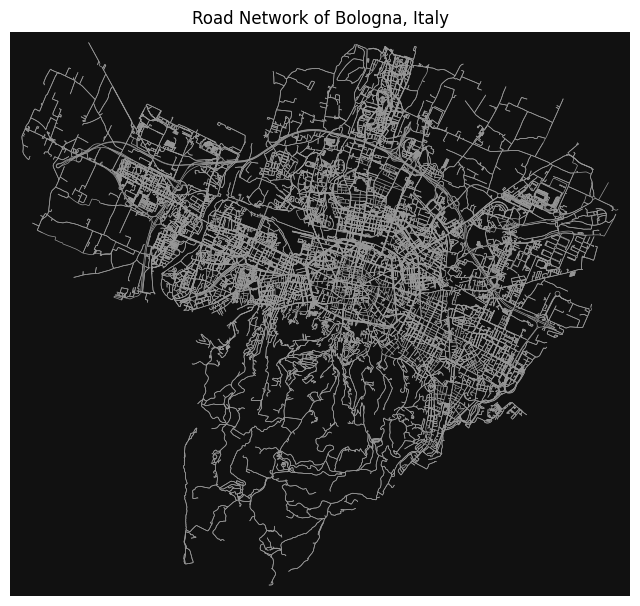

In [33]:

# Plot the network
fig, ax = ox.plot_graph(graph, 
                        node_size=0, 
                        edge_linewidth=0.5, 
                        show=False, 
                        close=False)

# Add title and show
plt.title(f"Road Network of {place_name}")
plt.show()


In [ ]:
# interactive exploration
m = ox.graph_to_gdfs(graph, nodes=False).explore(color='blue', tooltip=['name'])
m

In [8]:

# Save graph to file
ox.save_graph_geopackage(graph, filepath="../data/bologna_road_network.gpkg")
print("Road network saved to '../data/bologna_road_network.gpkg' ")

# Get some basic stats about the network
stats = ox.basic_stats(graph)



Road network saved to '../data/bologna_road_network.gpkg' 


In [9]:
graph_gdf = ox.graph_to_gdfs(graph, nodes=True, edges=True)


In [10]:
graph_gdf

(                     y          x  street_count            highway  ref  \
 osmid                                                                     
 6714648      44.524136  11.293704             3                NaN  NaN   
 6714672      44.516538  11.375632             3  motorway_junction  NaN   
 33344145     44.497690  11.350392             4                NaN  NaN   
 82550591     44.494209  11.346455             3                NaN  NaN   
 82550595     44.491467  11.346466             4    traffic_signals  NaN   
 ...                ...        ...           ...                ...  ...   
 12882980530  44.493912  11.357225             3                NaN  NaN   
 12882980562  44.496266  11.359729             4                NaN  NaN   
 12912462486  44.503942  11.335836             3                NaN  NaN   
 12945154496  44.495852  11.329946             1                NaN  NaN   
 12947446731  44.497167  11.321048             3                NaN  NaN   
 
          

In [11]:
stats

{'n': 5527,
 'm': 10977,
 'k_avg': 3.9721367830649537,
 'edge_length_total': 1422087.0339999916,
 'edge_length_avg': 129.55151990525567,
 'streets_per_node_avg': 2.826850009046499,
 'streets_per_node_counts': {0: 0,
  1: 745,
  2: 139,
  3: 3993,
  4: 631,
  5: 16,
  6: 3},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.13479283517278814,
  2: 0.025149267233580606,
  3: 0.7224534105301248,
  4: 0.11416681744165008,
  5: 0.002894879681563235,
  6: 0.0005427899402931065},
 'intersection_count': 4782,
 'street_length_total': 952566.4279999994,
 'street_segment_count': 7800,
 'street_length_avg': 122.12390102564095,
 'circuity_avg': 1.0738460670785148,
 'self_loop_proportion': 0.002564102564102564}

In [12]:
# Convert the graph from latitude/longitude (WGS83) 
# to the right UTM coordinate reference system for the area selected
G_proj = ox.project_graph(graph)
gdfs = ox.graph_to_gdfs(G_proj)



In [13]:
gdfs[0].geometry.type.unique()


array(['Point'], dtype=object)

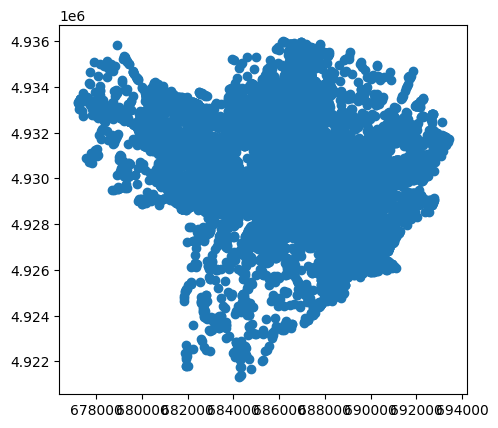

In [16]:
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False, nodes=True)
nodes_proj.plot()
plt.show()

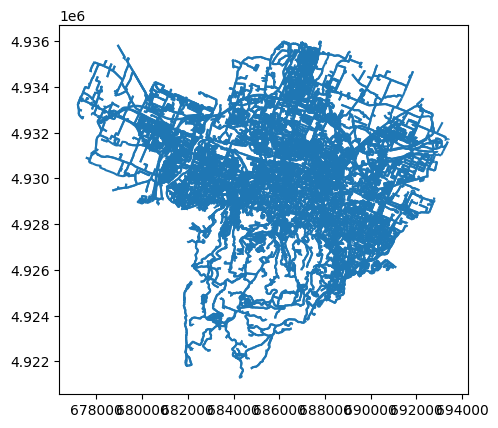

In [17]:
lines_proj = ox.graph_to_gdfs(G_proj, nodes=False)

lines_proj.plot()
plt.show()

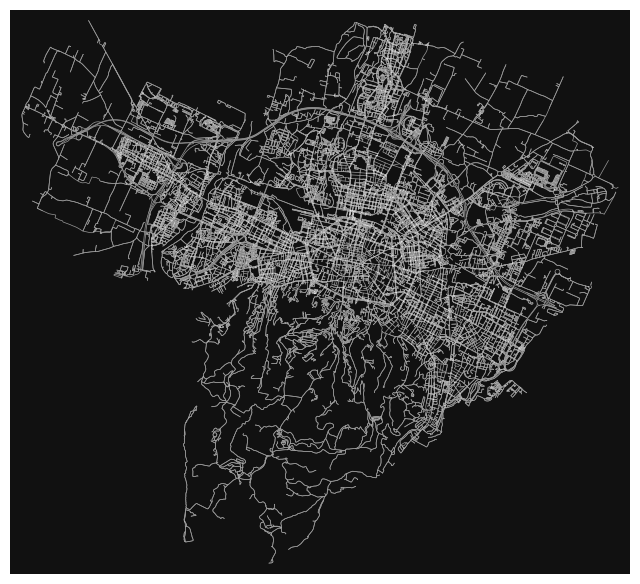

In [20]:
fig, ax = ox.plot_graph(graph, 
                        node_size=0.08, 
                        edge_linewidth=0.5, 
                        show=False, 
                        close=False)
plt.show()

In [15]:
edges = ox.graph_to_gdfs(graph,edges=True,nodes=False)


In [16]:
edges.head()

osmid  \
u        v          key                                      
82596491 2324314035 0                             27474209   
         926806953  0      [27474208, 27474209, 742213322]   
82596497 2507006493 0                            643536492   
         1268572050 0                            643536500   
         1841229459 0    [642916120, 705257675, 232364700]   

                                                                      name  \
u        v          key                                                      
82596491 2324314035 0                                   Località Pianerini   
         926806953  0    [Strada Provinciale Casteldelci, Località Pian...   
82596497 2507006493 0                                 Località Giardiniera   
         1268572050 0                                 Località Giardiniera   
         1841229459 0    [Località Giardiniera, Strada Provinciale Schi...   

                              highway  oneway reversed   length  \
u        v          key                                           
82596491 2324314035 0        tertiary   False    False   89.155   
         926806953  0        tertiary   False     True  589.962   
82596497 2507006493 0    unclassified   False     True   42.428   
         1268572050 0        tertiary   False     True  103.902   
         1841229459 0        tertiary   False    False  855.063   

                                                                  geometry  \
u        v          key                                                      
82596491 2324314035 0    LINESTRING (12.16659 43.79310, 12.16637 43.792...   
         926806953  0    LINESTRING (12.16659 43.79310, 12.16675 43.793...   
82596497 2507006493 0    LINESTRING (12.16002 43.78989, 12.15990 43.789...   
         1268572050 0    LINESTRING (12.16002 43.78989, 12.16013 43.789...   
         1841229459 0    LINESTRING (12.16002 43.78989, 12.15997 43.789...   

                        bridge   ref lanes junction maxspeed tunnel access  \
u        v          key                                                      
82596491 2324314035 0      NaN   NaN   NaN      NaN      NaN    NaN    NaN   
         926806953  0      yes   NaN   NaN      NaN      NaN    NaN    NaN   
82596497 2507006493 0      NaN   NaN   NaN      NaN      NaN    NaN    NaN   
         1268572050 0      NaN   NaN   NaN      NaN      NaN    NaN    NaN   
         1841229459 0      NaN  SP91   NaN      NaN      NaN    NaN    NaN   

                        width est_width area service  
u        v          key                               
82596491 2324314035 0     NaN       NaN  NaN     NaN  
         926806953  0     NaN       NaN  NaN     NaN  
82596497 2507006493 0     NaN       NaN  NaN     NaN  
         1268572050 0     NaN       NaN  NaN     NaN  
         1841229459 0     NaN       NaN  NaN     NaN

In [18]:
edges.columns
# [edges.travel_time == edges.travel_time.max()].name


Index(['osmid', 'name', 'highway', 'oneway', 'reversed', 'length', 'geometry',
       'bridge', 'ref', 'lanes', 'junction', 'maxspeed', 'tunnel', 'access',
       'width', 'est_width', 'area', 'service'],
      dtype='object')

# Accidents Data

In [12]:
gdf = gpd.read_file('../data/incidents.geojson')

In [13]:
gdf.head()

,geo_point_2d,anno,nomezona,numquart,nomequart,codzona,n_incident,totale_fer,totale_mor,n_pedoni_m,...,n_motoc_f,n_monop_m,n_monop_f,n_autist_m,n_autist_f,n_cicl_m,n_cicl_f,shape_leng,shape_area,geometry
0,"{'lon': 11.30127868937376, 'lat': 44.508639792...",2020,SANTA VIOLA,11,Borgo Panigale - Reno,None,24,29,1,0,...,10,0,0,0,13,0,2,0.0,1.947286e+06,"POLYGON ((11.31083 44.51134, 11.31082 44.51116..."
1,"{'lon': 11.304474385703132, 'lat': 44.47301202...",2020,SARAGOZZA - SAN LUCA,13,Porto - Saragozza,None,56,63,1,0,...,28,0,0,0,10,1,12,0.0,1.107967e+07,"POLYGON ((11.31905 44.49696, 11.31914 44.49695..."
2,"{'lon': 11.36102987231796, 'lat': 44.460354688...",2020,VIA TOSCANA - S. RUFFILLO - MONTE DONATO,16,Savena,None,22,25,0,0,...,11,0,0,0,7,0,1,0.0,4.016413e+06,"POLYGON ((11.35938 44.47460, 11.35941 44.47456..."
3,"{'lon': 11.39393754102888, 'lat': 44.482488107...",2021,FOSSOLO - DUE MADONNE,16,Savena,None,39,46,0,0,...,19,0,1,0,15,0,5,0.0,2.600538e+06,"POLYGON ((11.39100 44.48910, 11.39114 44.48905..."
4,"{'lon': 11.348720962675374, 'lat': 44.48904907...",2021,GALVANI,15,Santo Stefano,None,49,53,0,0,...,20,0,3,0,6,0,6,0.0,1.116791e+06,"POLYGON ((11.34831 44.49350, 11.34883 44.49329..."


In [54]:
gdf.nomequart.unique()


array(['Borgo Panigale - Reno', 'Porto - Saragozza', 'Savena',
       'Santo Stefano', 'Navile', 'San Donato - San Vitale'], dtype=object)

In [14]:
gdf.shape

(150, 22)

In [40]:
gdf.nomezona.nunique()

25

In [ ]:
gdf.drop_duplicates(subset=['geo_point_2d'])

In [ ]:
gdf.drop_duplicates(subset=['nomezona']).explore(color='red',
                    tiles='CartoDB positron', 
                    zoom=12, 
                  )

# 25 unique zones inside the bologna city

In [ ]:
### Insights
# - the dataset contains incidents from 2018 to 2023
# - it's an annually aggregated dataset, so each row represents the total number of incidents for that year in that zone
# - additionally the accident are aggregated by zone, which is a subdivision of the city of Bologna

In [ ]:

df = pd.read_excel('../data/Localization-accidents-stradali-2023.ods', engine='odf', sheet_name=0,  header=2)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57561 entries, 0 to 57560
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               57561 non-null  int64  
 1   Unnamed: 1               57561 non-null  object 
 2   Unnamed: 2               57561 non-null  int64  
 3   Unnamed: 3               57561 non-null  object 
 4   Unnamed: 4               57561 non-null  object 
 5   Unnamed: 5               57561 non-null  object 
 6   Unnamed: 6               57561 non-null  float64
 7   Unnamed: 7               57561 non-null  float64
 8   INCIDENTI                57561 non-null  int64  
 9   INCIDENTI MORTALI        57561 non-null  int64  
 10  MORTI                    57561 non-null  int64  
 11  FERITI                   57561 non-null  int64  
 12  NVEI                     57561 non-null  int64  
 13  Inc2RMoto                57561 non-null  int64  
 14  IncMerci              

In [4]:
df = pd.read_csv('../data/INCSTRAD_2023_IT/MICRODATI/INCSTRAD_Microdati_2023.txt', sep=None, engine='python', )


In [5]:
df.head()

,anno,provincia,comune,giorno,organo_di_rilevazione,localizzazione_incidente,denominazione_della_strada,tronco_di_strada_o_autostrada,tipo_di_strada,pavimentazione,...,morti_entro_30_giorni,feriti,descrizione_strada,Ora,chilometri,ettometrica,trimestre,Cilindrata_A_Classi,Cilindrata_B_Classi,Cilindrata_C_Classi
0,23,66,6,3,4,1,,,2,1,...,0,1,...,13,,,1,09,,
1,23,66,6,4,4,1,,,2,1,...,0,1,...,13,,,1,,,
2,23,66,6,2,4,1,,,2,1,...,0,5,...,8,,,1,08,11,
3,23,66,6,3,4,1,,,2,1,...,0,1,...,18,,,1,07,08,
4,23,66,6,6,4,1,,,2,1,...,0,1,...,14,,,1,11,07,08


In [13]:
bologna_data = df[df['provincia'] == 37]

In [14]:
bologna_data.head()

,anno,provincia,comune,giorno,organo_di_rilevazione,localizzazione_incidente,denominazione_della_strada,tronco_di_strada_o_autostrada,tipo_di_strada,pavimentazione,...,morti_entro_30_giorni,feriti,descrizione_strada,Ora,chilometri,ettometrica,trimestre,Cilindrata_A_Classi,Cilindrata_B_Classi,Cilindrata_C_Classi
94903,23,37,5,3,2,4,,12,3,1,...,0,2,...,24,,,2,,,
94904,23,37,39,2,2,1,,,2,1,...,0,1,...,11,,,1,09,,
94905,23,37,39,4,2,1,,,2,1,...,0,1,...,1,,,1,07,,
94906,23,37,3,4,2,2,,12,2,1,...,0,4,...,24,,,3,10,09,
94907,23,37,47,7,2,1,,,2,1,...,0,3,...,18,,,1,,09,


In [17]:
# Comprehensive filter for Metropolitan City of Bologna
def filter_bologna_metropolitan(df):
    # List of all 55 municipalities in Bologna Metropolitan City
    # You can also filter by province code if all municipalities share it
    
    # Method 1: By province code (recommended)
    bologna_metro = df[df['provincia'].astype(str).str.strip() == '37']
    
    # Method 2: Verify with known Bologna municipalities
    # Check if 'Bologna' city appears in the results
    if '006' in bologna_metro['comune'].values:
        print("✓ Bologna city found in filtered data")
    
    return bologna_metro

# Apply filter
bologna_data = filter_bologna_metropolitan(df)

# Summary statistics
print(f"\nBologna Metropolitan City Accident Data:")
print(f"Total accidents: {len(bologna_data)}")
print(f"Years covered: {bologna_data['anno'].min()} - {bologna_data['anno'].max()}")
print(f"Municipalities: {bologna_data['comune'].nunique()}")


Bologna Metropolitan City Accident Data:
Total accidents: 4069
Years covered: 23 - 23
Municipalities: 55


In [25]:
bologna_data.tronco_di_strada_o_autostrada.unique()

array(['12', '  ', '03', '36', '34'], dtype=object)

In [35]:
df.localizzazione_incidente.unique()

array([1, 6, 4, 3, 5, 2, 9, 0, 8, 7])

# Weather Data

In [ ]:

class FerraraWeatherDataRetriever:
    def __init__(self, api_key):
        self.api_key = api_key
        self.city = 'Ferrara'
        self.country_code = 'IT'
        self.base_url = 'http://api.openweathermap.org/data/2.5/forecast'

    def get_coordinates(self):
        # Coordinates for Ferrara
        return {
            'lat': 44.8366,
            'lon': 11.6199
        }

    def fetch_weather_data(self, start_date, end_date):
        coords = self.get_coordinates()
        
        params = {
            'lat': coords['lat'],
            'lon': coords['lon'],
            'appid': self.api_key,
            'units': 'metric'  # Use Celsius
        }

        try:
            response = requests.get(self.base_url, params=params)
            response.raise_for_status()
            data = response.json()

            processed_data = []
            for entry in data['list']:
                timestamp = datetime.fromtimestamp(entry['dt'])
                
                if start_date <= timestamp <= end_date:
                    weather_entry = {
                        'timestamp': timestamp,
                        'temperature': entry['main']['temp'],
                        'feels_like': entry['main']['feels_like'],
                        'humidity': entry['main']['humidity'],
                        'wind_speed': entry['wind']['speed'],
                        'description': entry['weather'][0]['description']
                    }
                    processed_data.append(weather_entry)

            return pd.DataFrame(processed_data)

        except requests.RequestException as e:
            print(f"Error fetching weather data: {e}")
            return None

def main():
    # Replace with your actual OpenWeatherMap API key
    API_KEY = os.getenv('OPENWEATHERMAP_API_KEY')

    # Create weather data retriever
    weather_retriever = FerraraWeatherDataRetriever(API_KEY)

    # Define date range
    start_date = datetime(2023, 1, 1)
    end_date = datetime(2023, 3, 31)

    # Fetch weather data
    weather_df = weather_retriever.fetch_weather_data(start_date, end_date)

    if weather_df is not None:
        # Display basic statistics
        print(weather_df.describe())

        # Optional: Save to CSV
        weather_df.to_csv('ferrara_weather_data.csv', index=False)
        print("Weather data saved to ferrara_weather_data.csv")
main()

Error fetching weather data: 401 Client Error: Unauthorized for url: http://api.openweathermap.org/data/2.5/forecast?lat=44.8366&lon=11.6199&appid=adfd3cb12b18ba8d848d47b5cc53366b&units=metric


In [ ]:

class FerraraWeatherDataRetriever:
    def __init__(self, api_key):
        self.api_key = api_key
        self.city = 'Ferrara'
        self.country_code = 'IT'
        self.base_url = 'https://api.openweathermap.org/data/2.5/forecast'

    def validate_api_key(self):
        """Validate the OpenWeatherMap API key"""
        validation_url = 'https://api.openweathermap.org/data/2.5/weather'
        params = {
            'q': self.city,
            'appid': self.api_key,
            'units': 'metric'
        }
        
        try:
            response = requests.get(validation_url, params=params)
            if response.status_code == 200:
                print("API Key is valid!")
                return True
            else:
                print(f"API Key validation failed. Status code: {response.status_code}")
                print(f"Response: {response.text}")
                return False
        except requests.RequestException as e:
            print(f"Error validating API key: {e}")
            return False

    def get_coordinates(self):
        # Coordinates for Ferrara
        return {
            'lat': 44.8366,
            'lon': 11.6199
        }

    def fetch_weather_data(self, start_date, end_date):
        # First, validate the API key
        if not self.validate_api_key():
            print("Cannot proceed without a valid API key")
            return None

        coords = self.get_coordinates()
        
        params = {
            'lat': coords['lat'],
            'lon': coords['lon'],
            'appid': self.api_key,
            'units': 'metric'  # Use Celsius
        }

        try:
            response = requests.get(self.base_url, params=params)
            
            # Detailed error handling
            if response.status_code != 200:
                print(f"HTTP Error: {response.status_code}")
                print(f"Response Content: {response.text}")
                return None

            data = response.json()

            processed_data = []
            for entry in data['list']:
                timestamp = datetime.fromtimestamp(entry['dt'])
                
                if start_date <= timestamp <= end_date:
                    weather_entry = {
                        'timestamp': timestamp,
                        'temperature': entry['main']['temp'],
                        'feels_like': entry['main']['feels_like'],
                        'humidity': entry['main']['humidity'],
                        'wind_speed': entry['wind']['speed'],
                        'description': entry['weather'][0]['description']
                    }
                    processed_data.append(weather_entry)

            return pd.DataFrame(processed_data)

        except requests.RequestException as e:
            print(f"Error fetching weather data: {e}")
            return None
        except KeyError as e:
            print(f"Error parsing weather data: {e}")
            return None

def main():
    # Important: Replace with your ACTUAL OpenWeatherMap API key
    API_KEY = os.getenv('OPENWEATHERMAP_API_KEY')

    # Create weather data retriever
    weather_retriever = FerraraWeatherDataRetriever(API_KEY)

    # Define date range
    start_date = datetime(2023, 1, 1)
    end_date = datetime(2023, 3, 31)

    # Fetch weather data
    weather_df = weather_retriever.fetch_weather_data(start_date, end_date)

    if weather_df is not None:
        # Display basic statistics
        print(weather_df.describe())

        # Optional: Save to CSV
        weather_df.to_csv('ferrara_weather_data.csv', index=False)
        print("Weather data saved to ferrara_weather_data.csv")

if __name__ == '__main__':
    main()

API Key is valid!


ValueError: Cannot describe a DataFrame without columns

In [ ]:

class FerraraWeatherDataRetriever:
    def __init__(self, api_key):
        self.api_key = api_key
        self.city = 'Ferrara'
        self.country_code = 'IT'
        self.base_url = 'https://api.openweathermap.org/data/2.5/forecast'

    def validate_api_key(self):
        """Validate the OpenWeatherMap API key"""
        validation_url = 'https://api.openweathermap.org/data/2.5/weather'
        params = {
            'q': self.city,
            'appid': self.api_key,
            'units': 'metric'
        }
        
        try:
            response = requests.get(validation_url, params=params)
            if response.status_code == 200:
                print("API Key is valid!")
                return True
            else:
                print(f"API Key validation failed. Status code: {response.status_code}")
                print(f"Response: {response.text}")
                return False
        except requests.RequestException as e:
            print(f"Error validating API key: {e}")
            return False

    def get_coordinates(self):
        # Coordinates for Ferrara
        return {
            'lat': 44.8366,
            'lon': 11.6199
        }

    def fetch_weather_data(self, start_date, end_date):
        # First, validate the API key
        if not self.validate_api_key():
            print("Cannot proceed without a valid API key")
            return None

        coords = self.get_coordinates()
        
        params = {
            'lat': coords['lat'],
            'lon': coords['lon'],
            'appid': self.api_key,
            'units': 'metric'  # Use Celsius
        }

        try:
            response = requests.get(self.base_url, params=params)
            
            # Detailed error handling
            if response.status_code != 200:
                print(f"HTTP Error: {response.status_code}")
                print(f"Response Content: {response.text}")
                return None

            data = response.json()

            processed_data = []
            for entry in data['list']:
                timestamp = datetime.fromtimestamp(entry['dt'])
                
                if start_date <= timestamp <= end_date:
                    weather_entry = {
                        'timestamp': timestamp,
                        'temperature': entry['main']['temp'],
                        'feels_like': entry['main']['feels_like'],
                        'humidity': entry['main']['humidity'],
                        'wind_speed': entry['wind']['speed'],
                        'description': entry['weather'][0]['description']
                    }
                    processed_data.append(weather_entry)

            # Check if processed_data is empty
            if not processed_data:
                print("No weather data found for the specified date range.")
                return None

            return pd.DataFrame(processed_data)

        except requests.RequestException as e:
            print(f"Error fetching weather data: {e}")
            return None
        except KeyError as e:
            print(f"Error parsing weather data: {e}")
            return None

def main():
    # Important: Replace with your ACTUAL OpenWeatherMap API key
    API_KEY = os.getenv('OPENWEATHERMAP_API_KEY')

    # Create weather data retriever
    weather_retriever = FerraraWeatherDataRetriever(API_KEY)

    # Define date range
    end_date = datetime.now()
    start_date = end_date - timedelta(days=5)  # Last 5 days

    # Fetch weather data
    weather_df = weather_retriever.fetch_weather_data(start_date, end_date)

    if weather_df is not None:
        # Check if DataFrame is not empty before describing
        if not weather_df.empty:
            # Display basic statistics
            print(weather_df.describe())

            # Optional: Save to CSV
            weather_df.to_csv('ferrara_weather_data.csv', index=False)
            print("Weather data saved to ferrara_weather_data.csv")
        else:
            print("The weather DataFrame is empty.")

if __name__ == '__main__':
    main()



API Key is valid!
No weather data found for the specified date range.


# Air Quality Data

## NO2

In [2]:
df = pd.read_csv('../data/air_quality_2024_bologna/NO2_hourly.csv')

In [3]:
df.head()

,data,DE AMICIS,v_DE AMICIS,GIARDINI MARGHERITA,v_GIARDINI MARGHERITA,PORTA SAN FELICE,v_PORTA SAN FELICE,SAN LAZZARO,v_SAN LAZZARO,VIA CHIARINI,v_VIA CHIARINI
0,2024-01-01 00:00,23.0,S,13.0,S,29.0,S,12.0,S,24.0,S
1,2024-01-01 01:00,15.0,S,19.0,S,25.0,S,20.0,S,22.0,S
2,2024-01-01 02:00,13.0,S,11.0,S,22.0,S,16.0,S,20.0,S
3,2024-01-01 03:00,13.0,S,8.0,S,22.0,S,17.0,S,21.0,S
4,2024-01-01 04:00,15.0,S,12.0,S,21.0,S,12.0,S,17.0,S


In [29]:
df.columns.to_list()

['data',
 'DE AMICIS',
 'v_DE AMICIS',
 'GIARDINI MARGHERITA',
 'v_GIARDINI MARGHERITA',
 'PORTA SAN FELICE',
 'v_PORTA SAN FELICE',
 'SAN LAZZARO',
 'v_SAN LAZZARO',
 'VIA CHIARINI',
 'v_VIA CHIARINI']

In [5]:
# get the station names(from the column names), in python, remove v_name prefix and suffix, also remove data column

station_names = [col for col in df.columns if col.startswith('v_')]
station_names = [name.replace('v_', '').replace('_name', '') for name in station_names]
station_names

['DE AMICIS',
 'GIARDINI MARGHERITA',
 'PORTA SAN FELICE',
 'SAN LAZZARO',
 'VIA CHIARINI']

In [6]:
stations_df = geocode_stations(station_names)


INFO: Geocoded 'DE AMICIS' as 'Via Edmondo De Amicis, Cirenaica, San Donato-San Vitale, Bologna, Emilia-Romagna, 14007, Italia'
INFO: Geocoded 'GIARDINI MARGHERITA' as 'Giardini Margherita, Santo Stefano, Bologna, Emilia-Romagna, Italia'
INFO: Geocoded 'PORTA SAN FELICE' as 'Porta San Felice, Piazza di Porta San Felice, Saffi, Porto-Saragozza, Bologna, Emilia-Romagna, 40122, Italia'
INFO: Geocoded 'SAN LAZZARO' as 'San Lazzaro di Savena, Bologna, Emilia-Romagna, 40068, Italia'
INFO: Geocoded 'VIA CHIARINI' as 'Via Giovanni Chiarini, Barca, Borgo Panigale-Reno, Casteldebole, Bologna, Emilia-Romagna, 40133, Italia'


In [26]:
stations_df

,station,latitude,longitude,address,geometry
0,DE AMICIS,44.497952,11.363212,"Via Edmondo De Amicis, Cirenaica, San Donato-S...",POINT (11.36321 44.49795)
1,GIARDINI MARGHERITA,44.482212,11.352675,"Giardini Margherita, Santo Stefano, Bologna, E...",POINT (11.35268 44.48221)
2,PORTA SAN FELICE,44.499235,11.327235,"Porta San Felice, Piazza di Porta San Felice, ...",POINT (11.32723 44.49924)
3,SAN LAZZARO,44.471567,11.404859,"San Lazzaro di Savena, Bologna, Emilia-Romagna...",POINT (11.40486 44.47157)
4,VIA CHIARINI,44.499803,11.287507,"Via Giovanni Chiarini, Barca, Borgo Panigale-R...",POINT (11.28751 44.49980)


In [ ]:
create_interactive_map(stations_df)


## CO

In [30]:
df_co = pd.read_csv('../data/air_quality_2024_bologna/CO_hourly.csv')

In [31]:
df_co.head()

,data,PORTA SAN FELICE,v_PORTA SAN FELICE
0,2024-01-01 00:00,0.6,S
1,2024-01-01 01:00,0.6,S
2,2024-01-01 02:00,0.5,S
3,2024-01-01 03:00,0.4,S
4,2024-01-01 04:00,0.4,S


## Ozone

In [32]:
df_oz = pd.read_csv('../data/air_quality_2024_bologna/Ozone_hourly.csv')

In [33]:
df_oz.head()

,data,GIARDINI MARGHERITA,v_GIARDINI MARGHERITA,VIA CHIARINI,v_VIA CHIARINI
0,2024-01-01 00:00,28.0,S,2.0,S
1,2024-01-01 01:00,11.0,S,2.0,S
2,2024-01-01 02:00,35.0,S,9.0,S
3,2024-01-01 03:00,42.0,S,11.0,S
4,2024-01-01 04:00,35.0,S,19.0,S


## PM10 and PM25

In [34]:
df_pm10 = pd.read_csv('../data/air_quality_2024_bologna/PM10_daily.csv')
df_pm25 = pd.read_csv('../data/air_quality_2024_bologna/PM25_daily.csv')

In [37]:
df_pm10.columns.to_list(), df_pm25.columns.to_list()

(['data',
  'DE AMICIS',
  'v_DE AMICIS',
  'GIARDINI MARGHERITA',
  'v_GIARDINI MARGHERITA',
  'PORTA SAN FELICE',
  'v_PORTA SAN FELICE',
  'SAN LAZZARO',
  'v_SAN LAZZARO',
  'VIA CHIARINI',
  'v_VIA CHIARINI'],
 ['data',
  'GIARDINI MARGHERITA',
  'v_GIARDINI MARGHERITA',
  'PORTA SAN FELICE',
  'v_PORTA SAN FELICE'])

# Road Map data

### Approach 1 - Overpass API

In [ ]:
# download the data with this query:
query = """
[out:json];
area["name"="Bologna"]->.searchArea;
(
  way["highway"](area.searchArea)["highway"~"motorway|trunk|primary|secondary|tertiary|residential|unclassified"];
  
);
out body;
(
  ._;
  way["lanes"](area.searchArea);
  way["maxspeed"](area.searchArea);
);
out tags qt;
>;
out skel qt;

"""

In [9]:
gpd_roads = gpd.read_file('../data/bologna_roads_with_speed.geojson', driver='GeoJSON')


In [17]:
gpd_roads.head().isna()

,id,@id,C.A.I.,abandoned:highway,access,access:backward,access:conditional,access:lanes,access:lanes:backward,access:lanes:forward,...,vehicle:lanes:backward,vehicle:lanes:forward,visible_name,width,width:lanes:backward,wikidata,wikimedia_commons,wikipedia,zone:maxspeed,geometry
0,False,False,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,False
1,False,False,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,False
2,False,False,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,False
3,False,False,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,False
4,False,False,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,False


In [23]:
gpd_roads['zone:maxspeed'].value_counts()

zone:maxspeed
IT:30    1171
30          2
20          1
IT:20       1
Name: count, dtype: int64

### Approach 2 - Wikimedia Italia

* doesn't have speed and type of lane data

In [ ]:

list_layers('../data/bologna_wikimedia.gpkg')

array([['points', 'Point'],
       ['lines', 'LineString'],
       ['multilinestrings', 'MultiLineString'],
       ['multipolygons', 'MultiPolygon'],
       ['other_relations', 'GeometryCollection']], dtype=object)

In [4]:
lines = gpd.read_file("../data/bologna_wikimedia.gpkg",layer="lines")


In [5]:
lines.highway.unique()


array(['service', 'tertiary', 'residential', 'motorway_link', 'primary',
       'pedestrian', 'construction', 'living_street', None, 'cycleway',
       'secondary', 'unclassified', 'footway', 'motorway', 'primary_link',
       'steps', 'trunk_link', 'track', 'trunk', 'path', 'secondary_link',
       'tertiary_link', 'busway', 'platform', 'corridor', 'services',
       'bus_stop', 'proposed', 'raceway'], dtype=object)

In [6]:
driving_roads = lines[lines.highway.isin(['secondary', 'trunk_link', 'trunk', 'motorway_link',
                          'residential','tertiary', 'unclassified', 'service',
                          'motorway', 'secondary_link', 'cycleway','primary',
                          'primary_link', 'tertiary_link', 'living_street','services',"yes"])]

In [20]:
driving_roads.head()

,osm_id,name,highway,waterway,aerialway,barrier,man_made,railway,z_order,other_tags,geometry
0,5010592,Via Filippo Re,service,None,None,None,None,None,0,"""surface""=>""asphalt""","LINESTRING (11.35429 44.50042, 11.35445 44.500..."
1,8116113,Via dell'Indipendenza,tertiary,None,None,None,None,None,4,"""alt_name""=>""Via Indipendenza"",""cycleway:both""...","LINESTRING (11.34385 44.49907, 11.34378 44.498..."
2,10048700,Via San Mamolo,residential,None,None,None,None,None,3,None,"LINESTRING (11.33655 44.47295, 11.33665 44.473..."
3,11480268,Via Giacomo Venezian,residential,None,None,None,None,None,3,"""cycleway:both""=>""no"",""lit""=>""yes"",""maxspeed""=...","LINESTRING (11.34089 44.49457, 11.34094 44.494..."
4,11480374,Strada Maggiore,tertiary,None,None,None,None,None,4,"""cycleway:right""=>""no"",""lanes""=>""1"",""lit""=>""ye...","LINESTRING (11.34646 44.49421, 11.34649 44.494..."


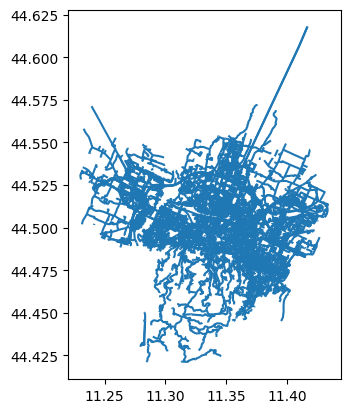

In [ ]:

driving_roads.plot()
plt.show()

# Land Cover and Land Use

In [ ]:
import pyrosm

osm = pyrosm.OSM("../data/land_use/037006_Bologna-2025-03-12T13Z.osm.pbf")


landuse = osm.get_landuse()


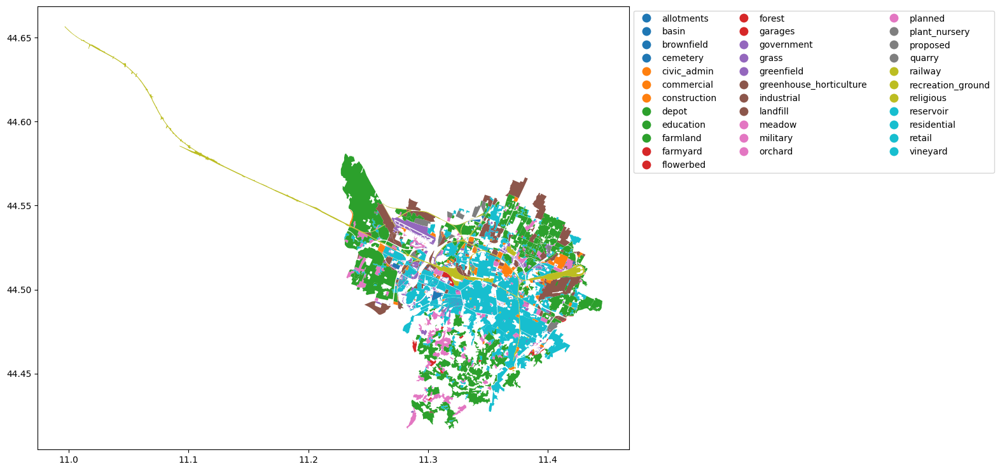

In [12]:


ax = landuse.plot(column="landuse", figsize=(12,12), legend=True, legend_kwds=dict(loc='upper left', ncol=3, bbox_to_anchor=(1, 1)))
plt.show()

In [15]:
landuse.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4095 entries, 0 to 4094
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   construction  10 non-null     object  
 1   depot         5 non-null      object  
 2   industrial    9 non-null      object  
 3   landuse       4095 non-null   object  
 4   meadow        28 non-null     object  
 5   military      6 non-null      object  
 6   residential   3 non-null      object  
 7   id            4095 non-null   int64   
 8   timestamp     4095 non-null   uint32  
 9   version       4095 non-null   int32   
 10  tags          4095 non-null   object  
 11  osm_type      4095 non-null   object  
 12  geometry      4095 non-null   geometry
 13  changeset     152 non-null    float64 
dtypes: float64(1), geometry(1), int32(1), int64(1), object(9), uint32(1)
memory usage: 416.0+ KB


In [16]:
landuse.head()

,construction,depot,industrial,landuse,meadow,military,residential,id,timestamp,version,tags,osm_type,geometry,changeset
0,None,None,None,commercial,None,None,None,23189490,1733619193,23,"{""visible"":false,""amenity"":""exhibition_centre""...",way,"POLYGON ((11.36857 44.51265, 11.37062 44.51109...",NaN
1,None,None,None,retail,None,None,None,27456592,1685871222,3,"{""visible"":false}",way,"POLYGON ((11.35368 44.48362, 11.35389 44.48364...",NaN
2,None,None,None,farmland,None,None,None,30189115,1455492147,3,"{""visible"":false}",way,"POLYGON ((11.35624 44.47659, 11.35670 44.47654...",NaN
3,None,None,None,allotments,None,None,None,30625718,1380213229,3,"{""visible"":false,""name"":""Area ortiva Giardini""...",way,"POLYGON ((11.35267 44.53868, 11.35235 44.53867...",NaN
4,None,None,None,grass,None,None,None,33533189,1422614450,3,"{""visible"":false}",way,"POLYGON ((11.35586 44.54312, 11.35584 44.54333...",NaN


In [13]:
landuse.columns

Index(['construction', 'depot', 'industrial', 'landuse', 'meadow', 'military',
       'residential', 'id', 'timestamp', 'version', 'tags', 'osm_type',
       'geometry', 'changeset'],
      dtype='object')

In [14]:
landuse.landuse.unique()

array(['commercial', 'retail', 'farmland', 'allotments', 'grass',
       'industrial', 'railway', 'meadow', 'military', 'recreation_ground',
       'cemetery', 'orchard', 'residential', 'quarry', 'basin',
       'landfill', 'vineyard', 'construction', 'garages', 'reservoir',
       'forest', 'brownfield', 'depot', 'plant_nursery', 'education',
       'religious', 'government', 'greenhouse_horticulture', 'greenfield',
       'flowerbed', 'planned', 'farmyard', 'proposed', 'civic_admin'],
      dtype=object)